# <span style="color:blue">Decision Trees</span> 


In [1]:
from IPython.display import Image

from IPython.core.display import HTML

import pandas as pd

import numpy as np

# DMT refers to Data Mining Techniques Book by Gordon Linoff and Michael Berry
# PDH refers to Python Data Science Handbook by Jake VanderPlas
# Frank Kane refers to Udemy Course called "Data Science, Deep Learning, & Machine Learning with Python" by Frank Kane

# Display all rows and columns of a dataframe
# https://www.youtube.com/watch?v=uIcime2nBjs

pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_colwidth', 1000)
pd.set_option('display.width', None)

<a href="https://www.cnbc.com/"><b><span style="color:blue">Markdown Weblink Example</span></b></a>

<a href="https://github.com/jakevdp/PythonDataScienceHandbook/tree/master/notebooks"><b><span style="color:blue">PDH Book Online</span></b></a>

### <span style="color:blue">What is this model?  How does it work?  How is it used?  When should you use it?</span> 

+ (scikitlearn/decision trees) Decision Trees are a non-parametric supervised learning method for classification and regression.  The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features.

+

+ (Frank Kane Section 4 Lecture 33) Decision Trees - you construct a flowchart to help you decide a classification...another form of Supervised Learning...At each step, find the attribute we can use to partition the data set to minimize the entropy (impurity) of the data at the next step...uses ID3 algorithm (Iterative Dichotomiser 3)

+ (DMT p203) Similar people have similar responses, or more broadly, things that are similar along multiple known dimensions have similar attributes as well.  (People or items with similar characteristics will be in similar groups)

+ 

+ (DMT p203) Decisions Trees is a technique that uses a collection of rules to assign observations to particular leaves of the tree

+ 

+ (DMT p237) Decision Trees recursively split data into smaller and smaller cells which are increasingly "pure" in the sense of having similar values of the target variable.  You can use decision trees for variable selection as well as for building models.  The Decision Tree uses the target variable to determine how each input variable should be partitioned.  In the end, the decision tree breaks the data into segments, defined by the splitting rules at each step.

+ (DMT p238) A Decision Tree is a hierarchical collection of rules that describes how to divide a large collection of records into successively smaller groups of records.  With each successive division, the members of the results segments become more and more similar to one another with respect to the target variable.

+ (DMT p240) Decision tree assign scores to new records, simply by letting each record flow through the tree to arrive at its appropriate leaf.

+ (DMT p244) A tree used to estimate the value of a numeric target variable (as opposed to the probability of class membership) is referred to as a regression tree.  The tree is built so that records in any given leaf all have target values close to the average for leaf - or in the language of statistics, the goal is to minimize the variance of the target values in each leaf.  The leaf average is the score assigned to any new record that matches the rule for the leaf.

+ (DMT p246) Decision Trees are Local Models.  Regression models are global and, as a consequence, regression models do not do a good job of fitting data that has local characteristics (in other words, characteristics that are particular to a certain group e.g. a group like those under the age of 18 as compared to those aged 35 to 45).  Trying to fit local phenomena in the input space (target variable) changes the values of the models everywhere.  Decision tree, on the other hand, are local models; they carve the input space (target variable) into segments and produce a separate estimate for each segment.

+ <b><span style="color:blue">Terminology:</span></b>

    + Root Node (DMT p239) contains all the training data to grow the tree.  
    + Children (DMT p239) aka child nodes aka branches
    + Leaves (DMT p239) Point of the tree is to split these records into nodes (leaves) dominated by a single class.  The nodes that ultimately get used are at the ends of their branches, with no children. (p240) Each leaf has a rule, which is based on the path through the tree.
    + Depth (DMT p245) Number of levels in a tree
+ (PDH p426) This notion - that multiple overfitting estimators can be combined to reduce the effect of overfitting - is what underlies an ensemble method called bagging.  Bagging makes use of an ensemble (a grab bag, perhaps) of parallel estimators, each of which overfits the data, and averages the results to find a better classification.  An ensemble of randomized decision trees is known as a random forest.


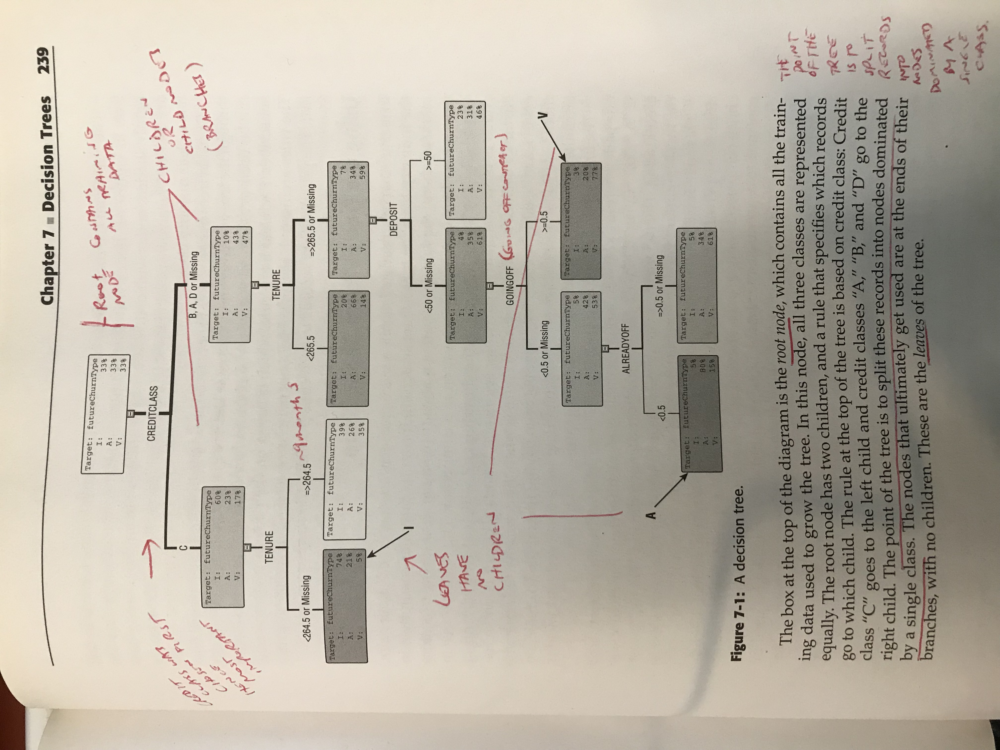

In [2]:
# (DMT p239)

# Decision Tree Terminology

Image(filename=r'''C:\GitHub Upload\Images\Decision Tree - DMT p239.jpg''')

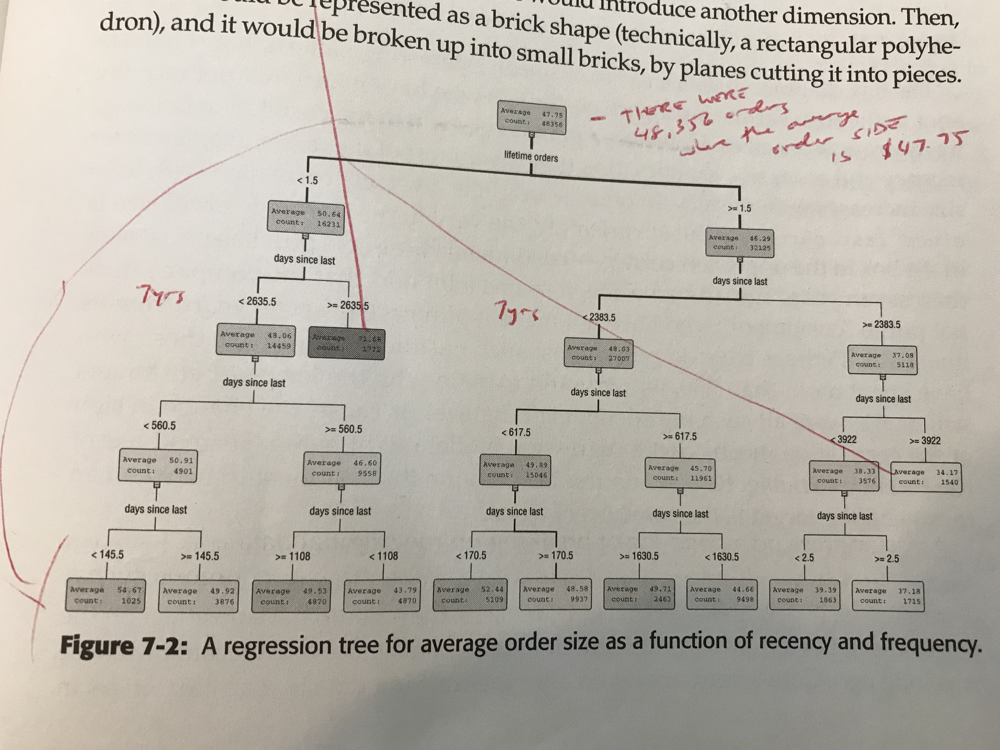

In [3]:
# (DMT p245-246)  The figure below shows a tree that uses only 2 input variables (days since last purchase, lifetime order) 
# to predict order size, a numeric variable.

# Decision Tree to Rectangular Axes

Image(filename=r'''C:\GitHub Upload\Images\Decision Tree - DMT p245.jpg''')

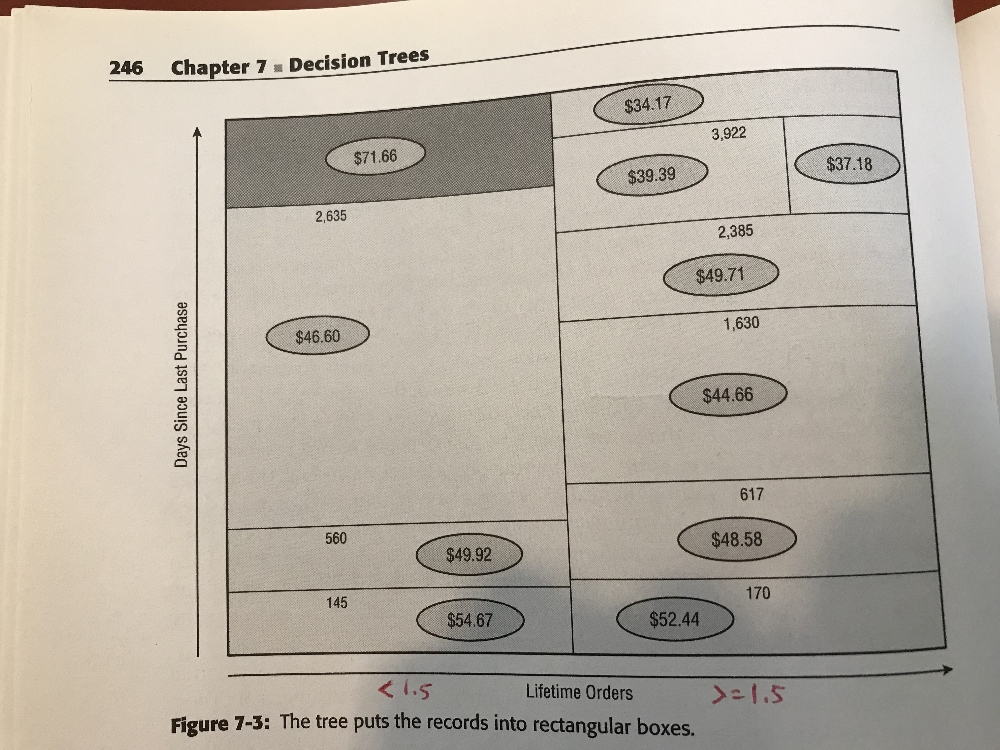

In [4]:
# (DMT p245-246)

# Decision Tree to Rectangular Axes

Image(filename=r'''C:\GitHub Upload\Images\Decision Tree - DMT p246.jpg''')

### <span style="color:blue">Tips and Words of Caution</span> 

+ (DMT p279) Use decision trees when your goal is to assign each record to one of a few broad categories.  Decision trees are also a natural choice when the goal is to generate understandable and explainable rules...the explanation for any particular classification or prediction is relatively straightforward.

+ (DMT p279) Decision trees require less data preparation than many other techniques because they are equally adept at handling continuous and categorical variables and not sensitive to outliers, skewed distributions, and missing vlaues

+ (DMT p240) Any variable can be used anywhere in the tree, and a variable can be used more than once.

+ (DMT p241) When faced with dozens or hundreds of unfamiliar variables, you can use a decision tree to direct your attention to a useful subset

+ (DMT p241) It is possible for different nodes to choose correlated or even synonymous variables.  An example is the inclusion of both credit class and deposit seen here.

+ (DMT p243) You can use the tree to produce Rankings and or Probabilities

    + (DMT p243) For many applications, the ordering of the scores is more important that the actual score themselves.  That is, knowing that Customer A has higher or lower churn than Customer B is more important than having an actual estimate of churn risk for each customer.  If a campaign is being designed for 10,000 customers, the purpose of the model is to find the 10,000 customers most likely to churn; determining the actual churn rate in not important.  
    
+ (DMT p249-250) Handling Numeric Input Variables, Categorical Input Variables, and Missing Values
    + (DMT p249) Nulls are allowable values
    
+ (DMT p252-262) Finding the Best Splitting Criterion (e.g. Gini, Entropy Reduction/Information Gain, CHAID (Chi-Square Automatic Interaction Detection), Incremental Response, Variance Reduction, etc.)

+ (DMT p262) One way to avoid overfitting is to set a large minimum leaf size or to cut away leaves through pruning
    +(DMT p263) Three approaches to pruning: CART, C5.0, Stability-Based Pruning
    
+ (scikitlearn/decision trees) <a href="http://scikit-learn.org/stable/modules/tree.html"><b><span style="color:blue">Advantages and Disadvantages</span></b></a> Risk of overfitting by creating overly-complex trees.  Decision trees can be unstable because small variations in the data might result in a completely different tree being generated.  This problem is mitigated by using trees within an ENSEMBLE.

+ (scikitlearn/decision trees) IMBALANCED DATASETS Decision tree learners create biased trees if some classes dominate. It is therefore recommended to balance the dataset prior to fitting with the decision tree. (see other sources below for website link to a good article)
    


### <span style="color:blue">What are different variations of this model (if applicable)?</span> 

+ (DMT p252-262) Finding the Best Splitting Criterion (e.g. Gini, Entropy Reduction/Information Gain, CHAID (Chi-Square Automatic Interaction Detection), Incremental Response, Variance Reduction, etc.)

+ (DMT p262) One way to avoid overfitting is to set a large minimum leaf size or to cut away leaves through pruning
    +(DMT p263) Three approaches to pruning: CART, C5.0, Stability-Based Pruning
 
+ (DMT p270) Decision Tree Variations
    +(DMT p270) Multiway Splits (trees with more than two branches (e.g. a 5 way split), Splitting on more than one field at a time, creating Nonrectangular Boxes, Support Vector Machines
    +(DMT p273-275) Good explanation of Support Vector Machines 

### <span style="color:blue">Other Sources</span> 

+ Scikit Learn Website: <a href="http://scikit-learn.org/stable/modules/tree.html">Link</a>
+ Imbalanced Data: <a href="https://machinelearningmastery.com/tactics-to-combat-imbalanced-classes-in-your-machine-learning-dataset/">Link</a>

What is Imbalanced Data?
Imbalanced data typically refers to a problem with classification problems where the classes are not represented equally.

For example, you may have a 2-class (binary) classification problem with 100 instances (rows). A total of 80 instances are labeled with Class-1 and the remaining 20 instances are labeled with Class-2.

### <span style="color:blue">How to explain to a layperson</span> 

In [5]:
# Youtube
HTML('<iframe width="300" height="200" src="https://www.youtube.com/embed/7VeUPuFGJHk" frameborder="0" allow="autoplay; encrypted-media" allowfullscreen></iframe>')


In [6]:
# What is Gini and how is it calculated?

HTML('<iframe width="300" height="200" src="https://www.youtube.com/embed/2lEcfRuHFV4" frameborder="0" allow="autoplay; encrypted-media" allowfullscreen></iframe>')

# Low Gini Value means more homogeneity in the branch of the decision tree.  High Gini Value means the branch may be able to 
# be broken into more branches

### <span style="color:blue">Parameters, Attributes, and Methods</span> 

+ Scikit Learn Website: Decision Tree Classifier: <a href="http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier">Link</a>

### <span style="color:blue">Code Practice</span> 

<a href="https://github.com/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.08-Random-Forests.ipynb"><b><span style="color:blue">PDH Code: Decision Tree</span></b></a>

In [7]:
# Python Data Science Handbook page 422

from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

# make_blobs is a tool to make random data

In [8]:
X,y=make_blobs(n_samples=300, centers=4, random_state=0, cluster_std=1.0)

X, y

(array([[  2.45830537e-02,   2.96215652e+00],
        [ -1.52392631e+00,   7.12573205e+00],
        [  1.27450825e+00,   5.63017322e+00],
        [ -8.65523345e-01,   7.80121774e+00],
        [  7.48740670e-01,   2.55579434e+00],
        [  4.35918422e+00,  -1.62352163e-01],
        [ -1.99576820e+00,   7.16440976e-01],
        [  1.70536064e+00,   4.43277024e+00],
        [  4.90616903e-01,   8.82985441e+00],
        [ -3.52995502e-01,   9.21042408e+00],
        [ -1.83601846e+00,   2.68441560e+00],
        [ -3.61784268e+00,   8.69951232e+00],
        [  1.42013331e+00,   4.63746165e+00],
        [ -2.88089030e+00,   6.26769229e+00],
        [  1.05505217e+00,  -6.47107437e-01],
        [  1.05472929e-01,   3.72493766e+00],
        [  1.13121750e+00,   4.68194985e+00],
        [  2.91209813e+00,   2.46638067e-01],
        [ -7.60240832e-01,   3.27417508e+00],
        [ -7.79715679e-01,   1.72893731e+00],
        [  3.15492712e+00,   1.55292739e+00],
        [  1.59167155e+00,   1.379

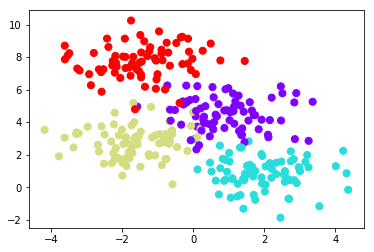

<module 'matplotlib.pyplot' from 'C:\\Users\\groldan\\AppData\\Local\\Enthought\\Canopy\\edm\\envs\\User\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [9]:
#y shows the colors

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='rainbow');

plt.show()

plt

In [10]:
import numpy as np

from sklearn.tree import DecisionTreeClassifier
tree = DecisionTreeClassifier().fit(X, y)


In [11]:
# Utility Function to help visualize the output

def visualize_classifier(model, X, y, ax=None, cmap='rainbow'):
    ax = ax or plt.gca()
    
    # Plot the training points
    ax.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=cmap,
               clim=(y.min(), y.max()), zorder=3)
    ax.axis('tight')
    ax.axis('off')
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    
    # fit the estimator
    model.fit(X, y)
    xx, yy = np.meshgrid(np.linspace(*xlim, num=200),
                         np.linspace(*ylim, num=200))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

    # Create a color plot with the results
    n_classes = len(np.unique(y))
    contours = ax.contourf(xx, yy, Z, alpha=0.3,
                           levels=np.arange(n_classes + 1) - 0.5,
                           cmap=cmap, clim=(y.min(), y.max()),
                           zorder=1)

    ax.set(xlim=xlim, ylim=ylim)

In [12]:
visualize_classifier(DecisionTreeClassifier(), X, y)

In [13]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier

tree = DecisionTreeClassifier()
bag = BaggingClassifier(tree, n_estimators=100, max_samples=0.8,
                        random_state=1)

bag.fit(X, y)
visualize_classifier(bag, X, y)

### <span style="color:blue">Mental Health Project</span> 

In [14]:
# Data Source: https://www.kaggle.com/osmi/mental-health-in-tech-survey
# Dataset Information
# This dataset is from a 2014 survey that measures attitudes towards mental health and frequency of mental health 
# disorders in the tech workplace. 

import pandas as pd

data=pd.read_excel(r'''C:\GitHub Upload\Mental Health in Tech - 0 - Raw Data.xlsx''',  
                   sheetname='Mental Health Data')

data.head()

# Goal is to identify what variables will help predict treatment and work_interfere
# treatment: Have you sought treatment for a mental health condition?
# work_interfere: If you have a mental health condition, do you feel that it interferes with your work?

,Timestamp,Age,Age_Impute,Income,Gender,Gender Cleaned,Country,state,self_employed,family_history,treatment,work_interfere,work_interfere (Yes/No),no_employees,remote_work,tech_company,benefits,care_options,wellness_program,seek_help,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence,comments,Test or Train Set
0,2014-08-27 11:29:00,37,37.0,69316.878303,Female,Female,United States,IL,NaN,No,Yes,Often,Yes,NaN,No,Yes,Yes,Not sure,No,Yes,Yes,Somewhat easy,No,No,Some of them,Yes,No,Maybe,Yes,No,NaN,Train
1,2014-08-27 11:29:00,32,32.0,59660.607523,Male,Male,Canada,NaN,NaN,No,No,Rarely,No,NaN,No,Yes,No,No,No,No,Don't know,Somewhat difficult,No,No,Yes,Yes,Yes,Yes,No,No,NaN,Train
2,2014-08-27 11:29:00,31,31.0,59828.445430,Male,Male,United Kingdom,NaN,NaN,Yes,Yes,Often,Yes,26-100,No,Yes,No,Yes,No,No,No,Somewhat difficult,Yes,Yes,Some of them,No,Maybe,Maybe,No,Yes,NaN,Train
3,2014-08-27 11:29:00,44,44.0,79017.019359,M,Male,United States,IN,NaN,No,No,Rarely,No,More than 1000,No,No,Don't know,No,Don't know,Don't know,Don't know,Don't know,Maybe,No,No,No,No,No,Don't know,No,NaN,Train
4,2014-08-27 11:30:00,31,31.0,43869.113953,Male,Male,United States,TX,NaN,No,No,Never,No,100-500,Yes,Yes,Yes,No,Don't know,Don't know,Don't know,Don't know,No,No,Some of them,Yes,Yes,Yes,Don't know,No,NaN,Train


+ Timestamp	
    + Timestamp <br><br>
+ Age
    + Age <br><br>
+ Gender
    + Gender <br><br>
+ Country
    + Country <br><br>
+ state	
    + If you live in the United States, which state or territory do you live in? <br><br>
+ self_employed	
    + Are you self-employed? <br><br>
+ family_history	
    + Do you have a family history of mental illness? <br><br>
+ treatment	
    + Have you sought treatment for a mental health condition? <br><br>
+ work_interfere	
    + If you have a mental health condition, do you feel that it interferes with your work? <br><br>
+ no_employees	
    + How many employees does your company or organization have? <br><br>
+ remote_work	
    + Do you work remotely (outside of an office) at least 50% of the time? <br><br>
+ tech_company	
    + Is your employer primarily a tech company/organization? <br><br>
+ benefits	
    + Does your employer provide mental health benefits? <br><br>
+ care_options	
    + Do you know the options for mental health care your employer provides? <br><br>
+ wellness_program	
    + Has your employer ever discussed mental health as part of an employee wellness program? <br><br>
+ seek_help	
    + Does your employer provide resources to learn more about mental health issues and how to seek help? <br><br>
+ anonymity	
    + Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources? <br><br>
+ leave	
    + How easy is it for you to take medical leave for a mental health condition? <br><br>
+ mental_health_consequence	
    + Do you think that discussing a mental health issue with your employer would have negative + consequences? <br><br>
+ phys_health_consequence	
    + Do you think that discussing a physical health issue with your employer would have negative + consequences? <br><br>
+ coworkers	
    + Would you be willing to discuss a mental health issue with your coworkers? <br><br>
+ supervisor	
    + Would you be willing to discuss a mental health issue with your direct supervisor(s)? <br><br>
+ mental_health_interview	
    + Would you bring up a mental health issue with a potential employer in an interview? <br><br>
+ phys_health_interview	
    + Would you bring up a physical health issue with a potential employer in an interview? <br><br>
+ mental_vs_physical	
    + Do you feel that your employer takes mental health as seriously as physical health? <br><br>
+ obs_consequence	
    + Have you heard of or observed negative consequences for coworkers with mental health conditions in your workplace? <br><br>
+ comments	
    + Any additional notes or comments <br><br>

In [15]:
from numpy import *
import datetime

data.fillna(9, inplace=True) # Replace blanks with 9
data.replace('Yes', 1, inplace=True)
data.replace('No', 0, inplace=True)

data

,Timestamp,Age,Age_Impute,Income,Gender,Gender Cleaned,Country,state,self_employed,family_history,treatment,work_interfere,work_interfere (Yes/No),no_employees,remote_work,tech_company,benefits,care_options,wellness_program,seek_help,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence,comments,Test or Train Set
0,2014-08-27 11:29:00,37,37.0,69316.878303,Female,Female,United States,IL,9,0,1,Often,1,9,0,1,1,Not sure,0,1,1,Somewhat easy,0,0,Some of them,1,0,Maybe,1,0,9,Train
1,2014-08-27 11:29:00,32,32.0,59660.607523,Male,Male,Canada,9,9,0,0,Rarely,0,9,0,1,0,0,0,0,Don't know,Somewhat difficult,0,0,1,1,1,1,0,0,9,Train
2,2014-08-27 11:29:00,31,31.0,59828.445430,Male,Male,United Kingdom,9,9,1,1,Often,1,26-100,0,1,0,1,0,0,0,Somewhat difficult,1,1,Some of them,0,Maybe,Maybe,0,1,9,Train
3,2014-08-27 11:29:00,44,44.0,79017.019359,M,Male,United States,IN,9,0,0,Rarely,0,More than 1000,0,0,Don't know,0,Don't know,Don't know,Don't know,Don't know,Maybe,0,0,0,0,0,Don't know,0,9,Train
4,2014-08-27 11:30:00,31,31.0,43869.113953,Male,Male,United States,TX,9,0,0,Never,0,100-500,1,1,1,0,Don't know,Don't know,Don't know,Don't know,0,0,Some of them,1,1,1,Don't know,0,9,Train
5,2014-08-27 11:31:00,35,35.0,47894.944556,Female,Female,United States,MI,9,1,1,Sometimes,1,9,1,1,0,0,0,0,0,Somewhat difficult,Maybe,Maybe,Some of them,0,0,0,Don't know,0,9,Train
6,2014-08-27 11:31:00,33,9.0,53587.192413,Male,Male,United States,TN,9,1,0,Sometimes,1,9,0,1,1,Not sure,0,Don't know,Don't know,Don't know,0,0,1,1,0,Maybe,Don't know,0,9,Train
7,2014-08-27 11:32:00,39,39.0,58340.576497,M,Male,Canada,9,9,0,0,Never,0,9,1,1,0,1,0,0,1,Don't know,0,0,0,0,0,0,0,0,9,Train
8,2014-08-27 11:32:00,31,31.0,53478.503208,Male,Male,United States,OH,9,0,1,Sometimes,1,9,1,1,Don't know,0,0,0,Don't know,Don't know,0,0,Some of them,1,0,0,Don't know,0,9,Train
9,2014-08-27 11:32:00,42,42.0,59437.611823,Female,Female,United States,IL,9,1,1,Sometimes,1,100-500,0,1,1,1,0,0,0,Very difficult,Maybe,0,1,1,0,Maybe,0,0,9,Test


scikit-learn needs everything to be numerical for decision trees to work. So, we'll map Y,N to 1,0 and levels of education to some scale of 0-2. In the real world, you'd need to think about how to deal with unexpected or missing data! By using map(), we know we'll get NaN for unexpected values.

In [16]:
c={'Male': 0, 'Female': 1, 9:9}
d={0:0, 1: 1, 9:9, "Don't know": 10, 'Maybe': 11, 'Some of them': 12, 'Not sure': 13}
e={'Never':0, 'Rarely':1, 'Sometimes':2, 'Often':3, 9:9}
f={"Don't know": 9, 'Very difficult': 0, 'Somewhat difficult': 1, 'Somewhat easy': 2, 'Very easy':3}
g={'26-100':0, '100-500':1, '500-1000':2, 'More than 1000':3, 9:9}

data['Gender Cleaned']=data['Gender Cleaned'].map(c)
data['self_employed']=data['self_employed'].map(d)
data['family_history']=data['family_history'].map(d)
data['treatment']=data['treatment'].map(d)
data['work_interfere']=data['work_interfere'].map(e)
data['no_employees']=data['no_employees'].map(g)
data['remote_work']=data['remote_work'].map(d)
data['tech_company']=data['tech_company'].map(d)
data['benefits']=data['benefits'].map(d)
data['care_options']=data['care_options'].map(d)
data['wellness_program']=data['wellness_program'].map(d)
data['seek_help']=data['seek_help'].map(d)
data['anonymity']=data['anonymity'].map(d)
data['mental_health_consequence']=data['mental_health_consequence'].map(d)
data['phys_health_consequence']=data['phys_health_consequence'].map(d)
data['coworkers']=data['coworkers'].map(d)
data['supervisor']=data['supervisor'].map(d)
data['leave']=data['leave'].map(f)
data['mental_health_interview']=data['mental_health_interview'].map(d)
data['phys_health_interview']=data['phys_health_interview'].map(d)
data['mental_vs_physical']=data['mental_vs_physical'].map(d)
data['obs_consequence']=data['obs_consequence'].map(d)

data

,Timestamp,Age,Age_Impute,Income,Gender,Gender Cleaned,Country,state,self_employed,family_history,treatment,work_interfere,work_interfere (Yes/No),no_employees,remote_work,tech_company,benefits,care_options,wellness_program,seek_help,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence,comments,Test or Train Set
0,2014-08-27 11:29:00,37,37.0,69316.878303,Female,1,United States,IL,9,0,1,3,1,9,0,1,1,13,0,1,1,2,0,0,12,1,0,11,1,0,9,Train
1,2014-08-27 11:29:00,32,32.0,59660.607523,Male,0,Canada,9,9,0,0,1,0,9,0,1,0,0,0,0,10,1,0,0,1,1,1,1,0,0,9,Train
2,2014-08-27 11:29:00,31,31.0,59828.445430,Male,0,United Kingdom,9,9,1,1,3,1,0,0,1,0,1,0,0,0,1,1,1,12,0,11,11,0,1,9,Train
3,2014-08-27 11:29:00,44,44.0,79017.019359,M,0,United States,IN,9,0,0,1,0,3,0,0,10,0,10,10,10,9,11,0,0,0,0,0,10,0,9,Train
4,2014-08-27 11:30:00,31,31.0,43869.113953,Male,0,United States,TX,9,0,0,0,0,1,1,1,1,0,10,10,10,9,0,0,12,1,1,1,10,0,9,Train
5,2014-08-27 11:31:00,35,35.0,47894.944556,Female,1,United States,MI,9,1,1,2,1,9,1,1,0,0,0,0,0,1,11,11,12,0,0,0,10,0,9,Train
6,2014-08-27 11:31:00,33,9.0,53587.192413,Male,0,United States,TN,9,1,0,2,1,9,0,1,1,13,0,10,10,9,0,0,1,1,0,11,10,0,9,Train
7,2014-08-27 11:32:00,39,39.0,58340.576497,M,0,Canada,9,9,0,0,0,0,9,1,1,0,1,0,0,1,9,0,0,0,0,0,0,0,0,9,Train
8,2014-08-27 11:32:00,31,31.0,53478.503208,Male,0,United States,OH,9,0,1,2,1,9,1,1,10,0,0,0,10,9,0,0,12,1,0,0,10,0,9,Train
9,2014-08-27 11:32:00,42,42.0,59437.611823,Female,1,United States,IL,9,1,1,2,1,1,0,1,1,1,0,0,0,0,11,0,1,1,0,11,0,0,9,Test


In [17]:
data.describe()

,Age,Age_Impute,Income,Gender Cleaned,self_employed,family_history,treatment,work_interfere,work_interfere (Yes/No),no_employees,remote_work,tech_company,benefits,care_options,wellness_program,seek_help,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
count,1.259000e+03,1.259000e+03,1.259000e+03,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000
mean,7.942815e+07,7.942814e+07,1.130373e+11,0.386815,0.244639,0.390786,0.505957,3.106434,0.483717,4.138205,0.298650,0.818904,3.619539,3.594917,1.675139,3.081811,6.803018,5.038125,4.399523,2.433678,7.555997,3.745830,1.843527,5.027006,4.847498,0.146148
std,2.818299e+09,2.818299e+09,4.010831e+12,1.335173,1.102336,0.488121,0.500163,3.160233,0.499933,3.783273,0.457848,0.385251,4.438482,5.440779,3.509711,4.421419,4.368476,3.642420,5.171159,4.514348,5.624781,5.141145,4.067414,5.333331,4.747916,0.353395
min,-1.726000e+03,-1.726000e+03,-3.282927e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.700000e+01,9.000000e+00,3.749508e+04,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.100000e+01,2.800000e+01,4.587199e+04,0.000000,0.000000,0.000000,1.000000,2.000000,0.000000,3.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,10.000000,3.000000,1.000000,0.000000,12.000000,1.000000,0.000000,1.000000,1.000000,0.000000
75%,3.600000e+01,3.400000e+01,5.705816e+04,0.000000,0.000000,1.000000,1.000000,3.000000,1.000000,9.000000,1.000000,1.000000,10.000000,1.000000,1.000000,10.000000,10.000000,9.000000,11.000000,1.000000,12.000000,12.000000,0.000000,11.000000,10.000000,0.000000
max,1.000000e+11,1.000000e+11,1.423139e+14,9.000000,9.000000,1.000000,1.000000,9.000000,1.000000,9.000000,1.000000,1.000000,10.000000,13.000000,10.000000,10.000000,10.000000,9.000000,11.000000,11.000000,12.000000,12.000000,11.000000,11.000000,10.000000,1.000000


In [18]:
features=data[['Age', 'Gender Cleaned', 'self_employed', 'family_history',  
               'work_interfere', 'no_employees', 'remote_work', 'tech_company', 'benefits', 
              'care_options', 'wellness_program', 'seek_help', 'anonymity', 'leave', 'mental_health_consequence', 
              'phys_health_consequence', 'coworkers', 'supervisor', 'mental_health_interview', 
              'phys_health_interview', 'mental_vs_physical', 'obs_consequence']]

featlab=['Age', 'Gender Cleaned', 'self_employed', 'family_history',  
               'work_interfere', 'no_employees', 'remote_work', 'tech_company', 'benefits', 
              'care_options', 'wellness_program', 'seek_help', 'anonymity', 'leave', 'mental_health_consequence', 
              'phys_health_consequence', 'coworkers', 'supervisor', 'mental_health_interview', 
              'phys_health_interview', 'mental_vs_physical', 'obs_consequence']

treatment=data['treatment'].values


features

,Age,Gender Cleaned,self_employed,family_history,work_interfere,no_employees,remote_work,tech_company,benefits,care_options,wellness_program,seek_help,anonymity,leave,mental_health_consequence,phys_health_consequence,coworkers,supervisor,mental_health_interview,phys_health_interview,mental_vs_physical,obs_consequence
0,37,1,9,0,3,9,0,1,1,13,0,1,1,2,0,0,12,1,0,11,1,0
1,32,0,9,0,1,9,0,1,0,0,0,0,10,1,0,0,1,1,1,1,0,0
2,31,0,9,1,3,0,0,1,0,1,0,0,0,1,1,1,12,0,11,11,0,1
3,44,0,9,0,1,3,0,0,10,0,10,10,10,9,11,0,0,0,0,0,10,0
4,31,0,9,0,0,1,1,1,1,0,10,10,10,9,0,0,12,1,1,1,10,0
5,35,1,9,1,2,9,1,1,0,0,0,0,0,1,11,11,12,0,0,0,10,0
6,33,0,9,1,2,9,0,1,1,13,0,10,10,9,0,0,1,1,0,11,10,0
7,39,0,9,0,0,9,1,1,0,1,0,0,1,9,0,0,0,0,0,0,0,0
8,31,0,9,0,2,9,1,1,10,0,0,0,10,9,0,0,12,1,0,0,10,0
9,42,1,9,1,2,1,0,1,1,1,0,0,0,0,11,0,1,1,0,11,0,0


In [19]:
# Do I need to normalize the data where most is binary?

In [20]:
from sklearn import tree

from sklearn.model_selection import train_test_split

(trainfeat, testfeat, traintreat, testtreat)=train_test_split(features, treatment, train_size=0.75, random_state=0)

C:\Users\groldan\AppData\Local\Enthought\Canopy\edm\envs\User\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [21]:
print(testfeat.iloc[:, 0].size, '\n')

print(trainfeat.iloc[:, 0].size)

315 

944


In [22]:
clf=tree.DecisionTreeClassifier(random_state=0)
clf=clf.fit(trainfeat, traintreat)

print(clf)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')


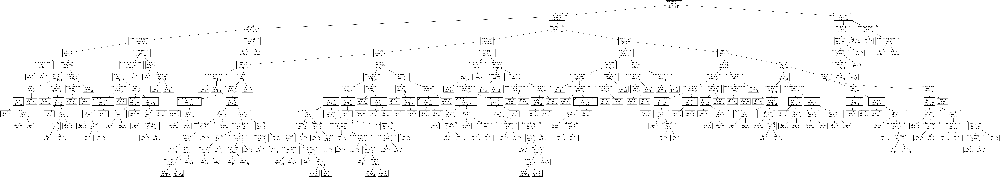

In [23]:
from IPython.display import Image  
from sklearn.externals.six import StringIO  
import pydotplus

dot_data = StringIO()  
tree.export_graphviz(clf, out_file=dot_data,  
                         feature_names=featlab)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

In [24]:
# Save graph image as pdf

graph.write_pdf(r'''C:\GitHub Upload\Misc\writeup - decision tree.pdf''')

True

In [25]:
# work_interfere is the top-most feature
# work_interfere map: {'Never':0, 'Rarely':1, 'Sometimes':2, 'Often':3, 9:9}

#counting a column in a dataframe (.value_counts()) vs. 
#counting an np array (import collections: collections.Counter(variable)

data['work_interfere'].value_counts()

2    465
9    264
0    213
1    173
3    144
Name: work_interfere, dtype: int64

In [26]:
# No Nulls in treatment

data['treatment'].value_counts()

1    637
0    622
Name: treatment, dtype: int64

In [27]:
import collections

collections.Counter(traintreat)

Counter({0: 469, 1: 475})

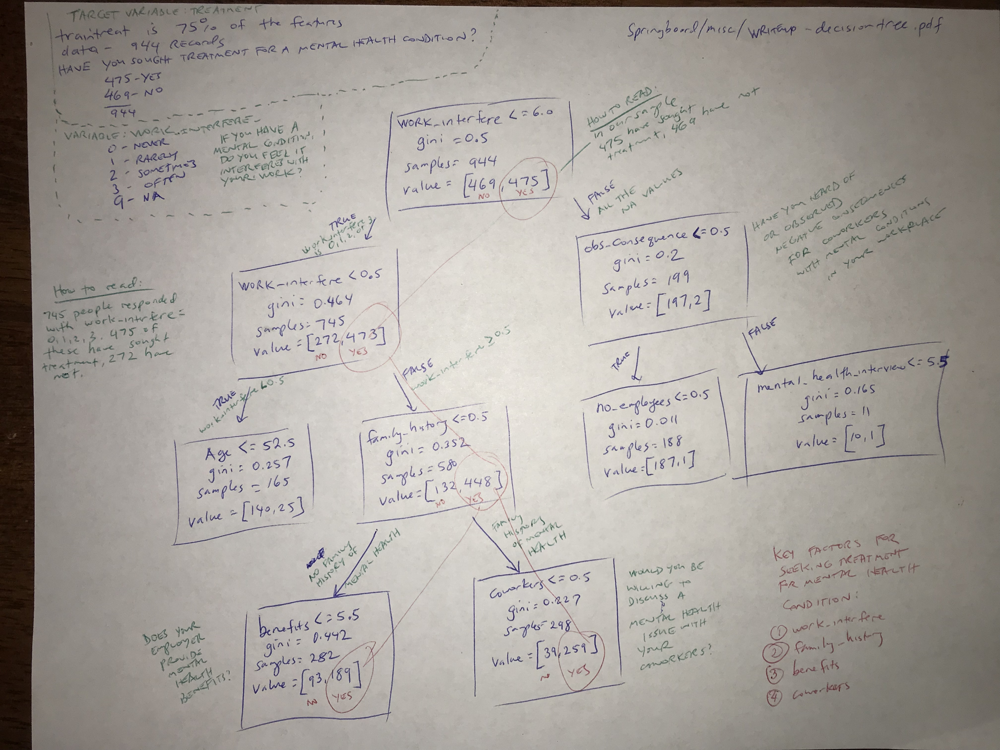

In [28]:
# My short interpretation of the Decision Tree

Image(filename=r'''C:\GitHub Upload\Images\Decision Tree - Mental Health Data.jpg''')

In [29]:
# Key factors for seeking Treatment for Mental Health

# 1. work_interfere - If you have a mental health condition, do you feel that it interferes with your work?

# 2. family_history - Do you have a family history of mental illness?

# 3. benefits - Does your employer provide mental health benefits?

# 4. coworkers - Would you be willing to discuss a mental health issue with your coworkers?

In [30]:
# Need a more narrow decision tree

clf=tree.DecisionTreeClassifier(random_state=0, max_depth=3)
clf=clf.fit(trainfeat, traintreat)
print(clf)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')


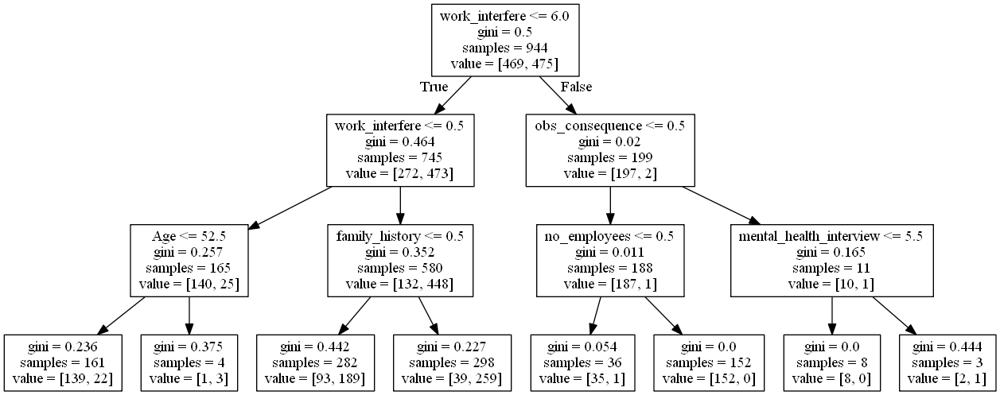

In [31]:
dot_data = StringIO()  
tree.export_graphviz(clf, out_file=dot_data,  
                         feature_names=featlab)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

In [32]:
# Determine the accuracy of this Decision Tree Model with Depth of 3 (using Training Data)

clf.score(trainfeat, traintreat)

0.83368644067796616

In [33]:
# Determine the accuracy of this Decision Tree Model with Depth of 3 (using Testing Data)

clf.score(testfeat, testtreat)

# 82.5% accuracy is close to the training data model accuracy

0.82539682539682535

In [34]:
# 0.82539 means that the model got 82.5% of the testtreat answers correct.  In other words 260 of the 315 treatment answers 
# were predicted correctly

# see file: C:\Users\groldan\Desktop\My Learning\Springboard\Misc\Decision Tree pred_v_actual.xlsx

In [35]:
testpredicted=clf.predict(testfeat)
print(testpredicted)

[1 0 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 1 1 1 1 1 1 0 1 1 1 1 1
 1 1 1 0 0 1 0 0 1 0 1 0 1 1 0 1 0 1 1 0 1 0 0 1 1 1 1 1 1 1 0 1 0 1 1 1 0
 1 0 0 1 1 1 0 0 1 1 0 1 1 1 1 0 1 1 1 0 1 1 0 0 1 1 0 0 0 1 1 1 1 1 1 1 0
 1 0 1 1 0 1 0 1 0 0 1 1 1 0 0 1 0 1 0 0 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0 0 0
 0 0 1 1 1 1 1 1 0 0 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1
 0 1 0 1 0 1 0 1 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0 1 0 1 0 1 1 1 0 1 0 1 1 1 1
 1 1 1 0 0 1 0 1 1 1 1 0 1 1 1 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 1 1 1 1 1 0 1
 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 0 1 0 0 1 0 1 1 1 1
 1 0 0 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 1]


In [36]:
testactual=testtreat
print(testactual)

[1 0 0 0 1 1 1 0 1 1 0 1 0 0 1 0 1 1 0 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0 1 1 1
 1 1 1 0 0 1 0 0 0 0 0 0 1 1 0 1 0 1 1 0 1 0 0 1 1 1 1 1 1 1 0 1 0 1 0 1 0
 1 0 1 0 1 1 0 0 1 1 0 1 1 1 0 0 1 1 0 0 1 0 0 0 1 1 0 0 0 0 1 0 0 1 1 0 0
 1 0 1 1 0 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 1 1 1 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 1 1 1 1 0 0 1 0 0 0 0 1 0 1 1 0 1 0 1 1 1 0 0 1 0 1 0 1 1 1 0 1 1
 0 1 0 1 0 1 0 0 1 1 1 1 1 0 0 0 1 0 1 1 0 1 0 1 0 1 0 0 0 1 0 1 0 1 1 1 0
 0 0 0 0 0 0 0 1 1 1 1 0 1 0 1 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 1 0 1 1 1
 1 1 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1 1 1 0 1 0 0 1 0 1 1 0 1
 1 1 0 1 0 1 1 0 0 1 0 0 1 1 0 0 1 0 1]


In [37]:
pred_vs_actual=pd.DataFrame(
    {'testpredicted':testpredicted,
    'testactual':testactual})

pred_vs_actual

,testactual,testpredicted
0,1,1
1,0,0
2,0,0
3,0,1
4,1,1
5,1,1
6,1,1
7,0,1
8,1,1
9,1,1


In [38]:
# DF TO EXCEL
from pandas import ExcelWriter

writer = ExcelWriter(r'''C:\GitHub Upload\Misc\Decision Tree pred_v_actual.xlsx''')
pred_vs_actual.to_excel(writer,'results')
writer.save()

### <span style="color:blue">What is the difference between a Random Forest and K-Fold?</span> 

+ Both are good techniques to help prevent overfitting to a single train/test split

+ (Frank Kane Section 4 Lecture 33) Decision Trees are very susceptible to overfitting.  Random Forests, like K-Fold cross validation, construct several alternate decision trees from the training data, but Random Forests “vote” on the final classification.
    + Random Forests randomly re-sample the input data for each tree, also known as bootstrapping, aggregating, or bagging.  It randomizes a subset of the attributes (features) each step is allowed to choose from

+ Scikit Learn Website: Random Forest Classifier: <a href="http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html">Link</a>
    + A random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and use averaging to improve the predictive accuracy and control over-fitting. <span style="color:red">The sub-sample size is always the same as the original input sample size but the samples are drawn with replacement if bootstrap=True (default).</span> 
    
+ (Frank Kane Section 7 Lecture 51) K-Fold Cross Validation splits the data into K randomly assigned segments and one segment is reserved as the test data.  For example if K=10 (or cv=10), there are 9 training segments and 1 testing segment.  Train on each of the K-1 segments and measure their performance against the test set.  Take the average of the K-1 r-squared scores.

In [39]:
# Youtube
HTML('<iframe width="300" height="200" src="https://www.youtube.com/embed/gJRhXp8Sm4Y" frameborder="0" allow="autoplay; encrypted-media" allowfullscreen></iframe>')

# minute 7:05

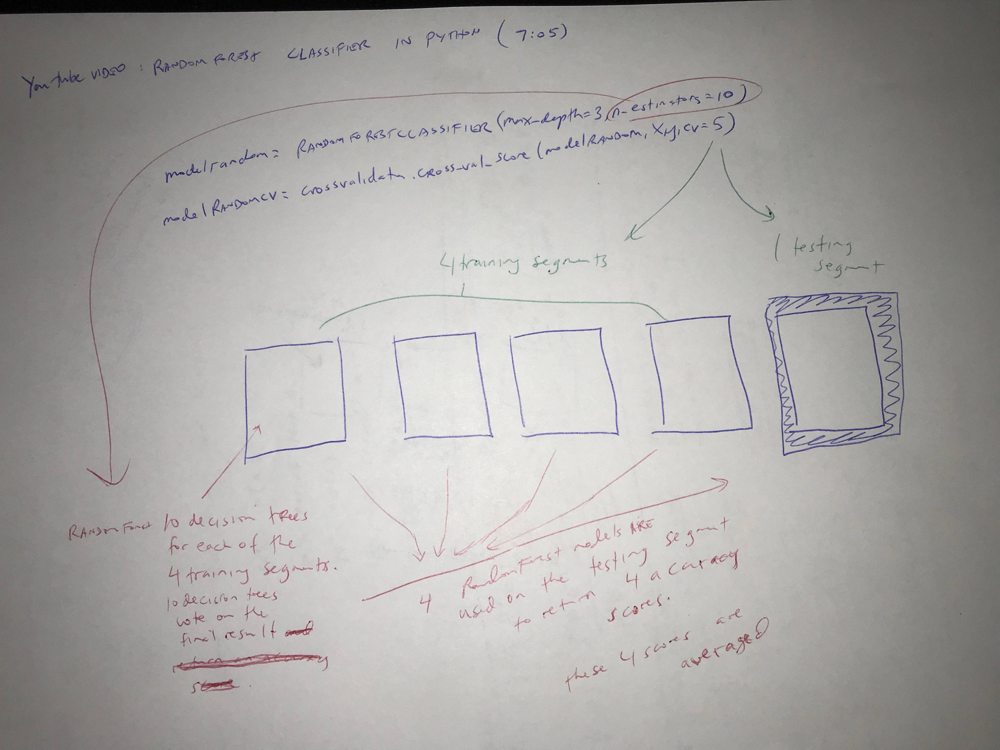

In [40]:
# My short interpretation of the Decision Tree

Image(filename=r'''C:\GitHub Upload\Images\Decision Tree - Random Forest plus Cross Validation.jpeg''')

In [41]:
from sklearn.ensemble import RandomForestClassifier

clf_randomforest=RandomForestClassifier(n_estimators=100)
clf_randomforest=clf_randomforest.fit(features, treatment) # <---- Should this use full data set or training set?  Frank uses the full data set
clf_randomforest.score(features, treatment) #Its possible to get a score of 1.0?!?

1.0

In [42]:
from sklearn.ensemble import RandomForestClassifier

clf_randomforest=RandomForestClassifier(n_estimators=100)
clf_randomforest=clf_randomforest.fit(trainfeat, traintreat) # <---- Should this use full data set or training set?  Frank uses the full data set
clf_randomforest.score(testfeat, testtreat) 

0.79365079365079361

In [43]:
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn import svm

# When using cross_val_score, use the entire data set not a defined training set because it will subset the entire data set into 
# multiple training sets

scores=cross_val_score(clf, features, treatment, cv=10)

print(scores)

print('\n')

print(scores.mean())

[ 0.82677165  0.83464567  0.83333333  0.83333333  0.81746032  0.84126984
  0.83333333  0.888       0.8         0.776     ]


0.828414748156


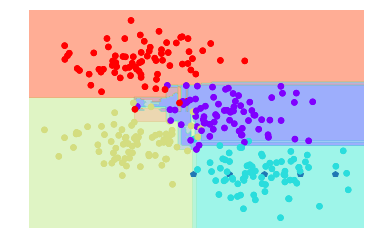

In [44]:
import matplotlib.pyplot as plt

plt.plot(scores, "p")
plt.show()